# Rt profile multicategorical versus uniform

In [1]:
# Import libraries
import numpy as np
import math
import branchpro
import scipy.stats
from branchpro.apps import ReproductionNumberPlot
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import pandas as pd
from cmdstanpy import CmdStanModel,  cmdstan_path
import arviz as az
import nest_asyncio
import seaborn as sns
nest_asyncio.apply()

num_timepoints = 100 # number of days for incidence data
num_categories = 2

In [2]:
# # Read contact matrix
# cm_file = 'UK'
# path = os.path.join('../data_library/contact_matrix', '{}.csv'.format(cm_file))
# contact_matrix = pd.read_csv(path, header=None)

# # Read serial interval
# si_file = 'si-epinow'
# path = os.path.join('../data_library/serial_interval', '{}.csv'.format(si_file))
# serial_interval = pd.read_csv(path, header=None)
# serial_interval = serial_interval.fillna(0)
# serial_intervals = serial_interval.values.T

# # Read transmissibility vector
# trans_file = 'UK'
# path = os.path.join('../data_library/transmissibility', '{}.csv'.format(trans_file))
# transmissibility = pd.read_csv(path, header=None)

In [3]:
# # Read Ontario data
# path = os.path.join('../data_library/covid_ontario/ON.csv')
# data = pd.read_csv(path)[:51]

## Parameterize example branching process model with disagregated data

In [4]:
# Build the serial interval w_s
ws_mean = 15.3
ws_var = 9.3**2
theta = ws_var / ws_mean
k = ws_mean / theta
w_dist = scipy.stats.gamma(k, scale=theta)
disc_w = w_dist.pdf(np.arange(num_timepoints))

# Simulate incidence data
initial_r = 1.2
serial_interval = disc_w

# contact_matrix = contact_matrix
contact_matrix = np.array([[8., 4.8], [1.2, 3.84]])
# contact_matrix = 1 * np.ones((2, 2))

transmissibility = [0.5, 1]
# transmissibility = [1.5, 1.5]

m = branchpro.MultiCatPoissonBranchProModel(
    initial_r, serial_interval, num_categories, contact_matrix, transmissibility)
new_rs = [0.5, 0.05, 0.2]          # sequence of R_0 numbers
start_times = [0, 30, 60]      # days at which each R_0 period begins
m.set_r_profile(new_rs, start_times)
parameters = [200, 20] # initial number of cases
times = np.arange(num_timepoints)

desagg_cases = m.simulate(parameters, times, var_contacts=True)
agg_cases = np.sum(desagg_cases, axis=1)

print(desagg_cases)

[[200.  20.]
 [  0.   0.]
 [  3.   2.]
 [  1.   1.]
 [  5.   2.]
 [  9.   6.]
 [ 34.   0.]
 [ 17.   6.]
 [ 24.   1.]
 [ 26.  19.]
 [ 18.  13.]
 [ 21.  15.]
 [ 33.   6.]
 [ 28.   7.]
 [ 36.  13.]
 [ 36.  19.]
 [ 95.  16.]
 [ 24.  13.]
 [ 57.  30.]
 [ 43.  27.]
 [ 62.  24.]
 [ 74.  23.]
 [ 74.  23.]
 [145.  20.]
 [102.  35.]
 [ 82.  26.]
 [157.  26.]
 [153.  43.]
 [ 79.  53.]
 [144.  42.]
 [185.  28.]
 [ 15.   9.]
 [ 21.   5.]
 [ 28.   3.]
 [ 14.   2.]
 [ 38.   7.]
 [ 20.   7.]
 [ 11.   4.]
 [ 16.   9.]
 [ 16.   3.]
 [ 10.   5.]
 [ 15.   2.]
 [  9.   8.]
 [ 17.   1.]
 [ 22.  14.]
 [ 12.   1.]
 [ 16.   3.]
 [ 15.   1.]
 [ 17.   5.]
 [  7.   5.]
 [  7.   4.]
 [ 18.   0.]
 [  6.   2.]
 [  6.   3.]
 [  9.   0.]
 [  9.   1.]
 [  7.   0.]
 [  9.   1.]
 [  7.   0.]
 [  5.   0.]
 [  5.   0.]
 [ 16.  16.]
 [ 16.   3.]
 [ 14.   7.]
 [ 18.   9.]
 [ 14.  10.]
 [ 28.   5.]
 [ 12.   1.]
 [  7.   4.]
 [ 16.   5.]
 [ 14.  11.]
 [ 26.   0.]
 [ 17.   5.]
 [ 32.   4.]
 [  9.   3.]
 [ 20.   7.]
 [ 16.   2.]

## Plot agreggated local incidence numbers

In [5]:
# Plot (bar chart cases each day)
fig = go.Figure()

# Plot of incidences
fig.add_trace(
    go.Bar(
        x=times,
        y=agg_cases,
        name='Incidences'
    )
)

# Add axis labels
fig.update_layout(
    xaxis_title='Time (days)',
    yaxis_title='New cases'
)

fig.show()

## R_t inference using STAN

In [6]:
# Same inference, but using the PoissonBranchProPosterior
tau = 6
R_t_start = tau+1
a = 1
b = 1/5
sigma = 1.5

# Correction for reproduction number per category
correc_i = np.multiply(np.sum(contact_matrix, axis=0), transmissibility)
correc_e = np.multiply(np.sum(m.exact_contact_matrix, axis=1), transmissibility)

In [7]:
# Transform our incidence data into pandas dataframes
multicat_inc_data_matrix = {'Time': np.arange(num_timepoints)}

for _ in range(num_categories):
    multicat_inc_data_matrix['Incidence Number Cat {}'.format(_+1)] = \
        desagg_cases[:, _]

multicat_inc_data = pd.DataFrame(multicat_inc_data_matrix)

# Transform our incidence data into pandas dataframes
inc_data = pd.DataFrame(
    {
        'Time': np.arange(num_timepoints),
        'Incidence Number': agg_cases
    }
)

L1 = len(np.arange(R_t_start, start_times[1]+1))
L2 = len(np.arange(start_times[1]+1, start_times[2]+1))
L3 = len(np.arange(start_times[2]+1, num_timepoints))

ground_truth = []
for j in range(num_categories):
    ground_truth.append(pd.DataFrame({
        'Time Points': np.arange(R_t_start, num_timepoints),
        'R_t': (0.5*correc_e[R_t_start:(start_times[1]+1), j]).tolist() + (0.05*correc_e[(start_times[1]+1):(start_times[2]+1), j]).tolist() + (0.2*correc_e[(start_times[2]+1):num_timepoints, j]).tolist()
    }))

## 1. Perfect Contact Tracing + Desaggregated data + Poisson Branching process with multiple categories

In [8]:
exact_multicat_model = """
functions {
    real normalizing_const (array [] real aSI) {
        return sum(aSI);
    }
    real effective_no_infectives (
        int N, int S, int n, int i, int t, array [,] real aI, array [] real aSI,
        array [,,] real C, array [] real transm) {
            real mean;

            mean = 0;
            for(j in 1:n){
                if(t > S) {
                    mean += C[t,i,j] * transm[j] * (
                        dot_product(aI[(t-S):(t-1), j], aSI) /
                        normalizing_const(aSI));
                }
                else {
                    mean += C[t,i,j] * transm[j] * (
                        dot_product(aI[:(t-1), j], aSI[(S-t+2):]) /
                        normalizing_const(aSI));
                }
            }
            return mean;
    }
}
data {
    int N; // number of days
    int S; // length serial interval
    int n; // number of categories
    array [N, n, n] real C; // contact matrix
    array [n] real transm; // transmissibility vector
    array [N, n] int I; // local incidences for N days
    int tau; // sliding window
    array [S] real revSI; // reversed serial interval
    real a; // prior shape parameter
    real b; // prior rate parameter
    real<lower=0> sigma; // prior std parameter
}
parameters {
    array [N-tau-1] real<lower=0> R; // vector of R numbers
}
model {
    for(t in (tau+1):(N-1)) {
        for (i in 1:n){
            for(k in (t-tau+1):(t+1)) {
                if (effective_no_infectives(N, S, n, i, k, I, revSI, C, transm) != 0) {
                    I[k, i] ~ poisson (
                        R[t-tau] * effective_no_infectives(
                            N, S, n, i, k, I, revSI, C, transm)); // likelihood
                        }
            }
        }
    }
    for(t in 1:(N-tau-1)) {
        R[t] ~ gamma (a, b); // prior of R
    }
}
"""

exact_multicat_data = {
    'N': num_timepoints,
    'S': len(serial_interval),
    'n': num_categories,
    'C': np.array(m.exact_contact_matrix),
    'transm': transmissibility,
    'I': desagg_cases.astype(np.integer).tolist(),
    'tau': tau,
    'revSI': serial_interval.tolist()[::-1],
    'a': a,
    'b': b,
    'sigma': sigma}

/var/folders/ph/jyxnc9y52svgq2k5lt2q4r000000gp/T/ipykernel_11401/2203937616.py:67: DeprecationWarning:

Converting `np.integer` or `np.signedinteger` to a dtype is deprecated. The current result is `np.dtype(np.int_)` which is not strictly correct. Note that the result depends on the system. To ensure stable results use may want to use `np.int64` or `np.int32`.



In [9]:
posterior = stan.build(
    exact_multicat_model, data=exact_multicat_data, random_seed=10)

fit = posterior.sample(
    num_chains=3, num_samples=1000)

samples = az.from_cmdstanpy(
    fit,
    observed_data='I',
    coords={'observation': list(range(num_timepoints)),
            'covariate': [
                '{}'.format(_)
                for _ in range(num_timepoints - R_t_start)]
            },
    dims={
        'I': ['observation'],
        'R': ['covariate']
        })

az.summary(samples)

Building...



Building: found in cache, done.Messages from stanc:
    provided, or the prior(s) depend on data variables. In the later case,
    this may be a false positive.
Sampling:   0%
Sampling:   0% (1/6000)
Sampling:   0% (2/6000)
Sampling:   0% (3/6000)
Sampling:   2% (102/6000)
Sampling:   3% (201/6000)
Sampling:   5% (300/6000)
Sampling:   7% (400/6000)
Sampling:   8% (500/6000)
Sampling:  10% (600/6000)
Sampling:  12% (700/6000)
Sampling:  13% (800/6000)
Sampling:  15% (900/6000)
Sampling:  17% (1000/6000)
Sampling:  18% (1100/6000)
Sampling:  20% (1200/6000)
Sampling:  22% (1300/6000)
Sampling:  23% (1400/6000)
Sampling:  25% (1500/6000)
Sampling:  27% (1600/6000)
Sampling:  28% (1700/6000)
Sampling:  30% (1800/6000)
Sampling:  32% (1900/6000)
Sampling:  33% (2000/6000)
Sampling:  35% (2100/6000)
Sampling:  37% (2200/6000)
Sampling:  38% (2300/6000)
Sampling:  40% (2400/6000)
Sampling:  42% (2500/6000)
Sampling:  43% (2600/6000)
Sampling:  45% (2700/6000)
Sampling:  47% (2800/6000)
Samp

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
R[0],0.526,0.056,0.420,0.627,0.001,0.001,3667.0,2196.0,1.0
R[1],0.520,0.050,0.423,0.609,0.001,0.001,4552.0,2350.0,1.0
R[2],0.513,0.041,0.436,0.591,0.001,0.000,4083.0,2140.0,1.0
R[3],0.494,0.037,0.428,0.567,0.001,0.000,3987.0,1922.0,1.0
R[4],0.508,0.035,0.446,0.578,0.001,0.000,3965.0,2078.0,1.0
...,...,...,...,...,...,...,...,...,...
R[88],0.191,0.013,0.168,0.217,0.000,0.000,3864.0,2557.0,1.0
R[89],0.185,0.013,0.159,0.208,0.000,0.000,4608.0,2497.0,1.0
R[90],0.186,0.014,0.160,0.211,0.000,0.000,3770.0,1913.0,1.0
R[91],0.193,0.014,0.168,0.220,0.000,0.000,3402.0,1794.0,1.0


array([[<AxesSubplot:title={'center':'R\n0'}>,
        <AxesSubplot:title={'center':'R\n0'}>],
       [<AxesSubplot:title={'center':'R\n1'}>,
        <AxesSubplot:title={'center':'R\n1'}>],
       [<AxesSubplot:title={'center':'R\n2'}>,
        <AxesSubplot:title={'center':'R\n2'}>],
       [<AxesSubplot:title={'center':'R\n3'}>,
        <AxesSubplot:title={'center':'R\n3'}>],
       [<AxesSubplot:title={'center':'R\n4'}>,
        <AxesSubplot:title={'center':'R\n4'}>],
       [<AxesSubplot:title={'center':'R\n5'}>,
        <AxesSubplot:title={'center':'R\n5'}>],
       [<AxesSubplot:title={'center':'R\n6'}>,
        <AxesSubplot:title={'center':'R\n6'}>],
       [<AxesSubplot:title={'center':'R\n7'}>,
        <AxesSubplot:title={'center':'R\n7'}>],
       [<AxesSubplot:title={'center':'R\n8'}>,
        <AxesSubplot:title={'center':'R\n8'}>],
       [<AxesSubplot:title={'center':'R\n9'}>,
        <AxesSubplot:title={'center':'R\n9'}>],
       [<AxesSubplot:title={'center':'R\n10'}>,
  

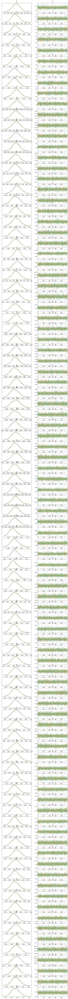

In [10]:
az.rcParams['plot.max_subplots'] = 2*(num_timepoints - R_t_start)

az.plot_trace(
    samples,
    var_names=('R'),
    filter_vars='like',
    compact=False)

In [11]:
# Eliminate burn-in iterations (1/2 of the chain lengths)
chain_samples = fit._draws[7:, 500:, :]

# Evaluate the model for all parameter sets in the samples
n_param, n_sample, n_chains = chain_samples.shape

extended_samples = np.concatenate((
    chain_samples[:, :, 0],
    chain_samples[:, :, 1],
    chain_samples[:, :, 2]), axis=1)

thinning = max(1, int(n_sample * n_chains / 500))
exact_multicat_intervals = []

for j in range(num_categories):
    exact_multicat_intervals.append(pd.DataFrame({
        'Time Points': np.arange(R_t_start, num_timepoints),
        'Mean': np.mean(extended_samples[:, ::thinning] * correc_e[R_t_start:, j][:, None], axis=1),
        'Lower bound CI': np.quantile(extended_samples[:, ::thinning] * correc_e[R_t_start:, j][:, None], 0.025, axis=1),
        'Upper bound CI': np.quantile(extended_samples[:, ::thinning] * correc_e[R_t_start:, j][:, None], 0.975, axis=1),
        'Central Probability': (L1+L2+L3) * [0.95]
    }))

## 2. Imperfect Contact Tracing + Desaggregated data + Poisson Branching process with multiple categories

In [12]:
approx_multicat_model = """
functions {
    real normalizing_const (array [] real aSI) {
        return sum(aSI);
    }
    real effective_no_infectives (
        int N, int S, int n, int i, int t, array [,] real aI, array [] real aSI,
        array [,] real C, array [] real transm) {
            real mean;

            mean = 0;
            for(j in 1:n){
                if(t > S) {
                    mean += C[i,j] * transm[j] * (
                        dot_product(aI[(t-S):(t-1), j], aSI) /
                        normalizing_const(aSI));
                }
                else {
                    mean += C[i,j] * transm[j] * (
                        dot_product(aI[:(t-1), j], aSI[(S-t+2):]) /
                        normalizing_const(aSI));
                }
            }
            return mean;
    }
}
data {
    int N; // number of days
    int S; // length serial interval
    int n; // number of categories
    array [n, n] real C; // contact matrix
    array [n] real transm; // transmissibility vector
    array [N, n] int I; // local incidences for N days
    int tau; // sliding window
    array [S] real revSI; // reversed serial interval
    real a; // prior shape parameter
    real b; // prior rate parameter
    real<lower=0> sigma; // prior std parameter
}
parameters {
    array [N-tau-1] real<lower=0> R; // vector of R numbers
}
model {
    for(t in (tau+1):(N-1)) {
        for (i in 1:n){
            for(k in (t-tau+1):(t+1)) {
                if (effective_no_infectives(N, S, n, i, k, I, revSI, C, transm) != 0) {
                    I[k, i] ~ poisson (
                        R[t-tau] * effective_no_infectives(
                            N, S, n, i, k, I, revSI, C, transm)); // likelihood
                        }
            }
        }
    }
    for(t in 1:(N-tau-1)) {
        R[t] ~ gamma (a, b); // prior of R
    }
}
"""

approx_multicat_data = {
    'N': num_timepoints,
    'S': len(serial_interval),
    'n': num_categories,
    'C': contact_matrix,
    'transm': transmissibility,
    'I': desagg_cases.astype(np.integer).tolist(),
    'tau': tau,
    'revSI': serial_interval.tolist()[::-1],
    'a': a,
    'b': b,
    'sigma': sigma}

/var/folders/ph/jyxnc9y52svgq2k5lt2q4r000000gp/T/ipykernel_11401/4283690943.py:67: DeprecationWarning:

Converting `np.integer` or `np.signedinteger` to a dtype is deprecated. The current result is `np.dtype(np.int_)` which is not strictly correct. Note that the result depends on the system. To ensure stable results use may want to use `np.int64` or `np.int32`.



In [13]:
posterior = stan.build(
    approx_multicat_model, data=approx_multicat_data, random_seed=10)

fit = posterior.sample(
    num_chains=3, num_samples=1000)

samples = az.from_cmdstanpy(
    fit,
    observed_data='I',
    coords={'observation': list(range(num_timepoints)),
            'covariate': [
                '{}'.format(_)
                for _ in range(num_timepoints - R_t_start)]
            },
    dims={
        'I': ['observation'],
        'R': ['covariate']
        })

az.summary(samples)

Building...



Building: found in cache, done.Messages from stanc:
    provided, or the prior(s) depend on data variables. In the later case,
    this may be a false positive.
Sampling:   0%
Sampling:   0% (1/6000)
Sampling:   0% (2/6000)
Sampling:   0% (3/6000)
Sampling:   2% (102/6000)
Sampling:   3% (201/6000)
Sampling:   5% (300/6000)
Sampling:   7% (400/6000)
Sampling:   8% (500/6000)
Sampling:  10% (600/6000)
Sampling:  12% (700/6000)
Sampling:  13% (800/6000)
Sampling:  15% (900/6000)
Sampling:  17% (1000/6000)
Sampling:  18% (1100/6000)
Sampling:  20% (1200/6000)
Sampling:  22% (1300/6000)
Sampling:  23% (1400/6000)
Sampling:  25% (1500/6000)
Sampling:  27% (1600/6000)
Sampling:  28% (1700/6000)
Sampling:  30% (1800/6000)
Sampling:  32% (1900/6000)
Sampling:  33% (2000/6000)
Sampling:  35% (2100/6000)
Sampling:  37% (2200/6000)
Sampling:  38% (2300/6000)
Sampling:  40% (2400/6000)
Sampling:  42% (2500/6000)
Sampling:  43% (2600/6000)
Sampling:  45% (2700/6000)
Sampling:  47% (2800/6000)
Samp

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
R[0],0.504,0.054,0.400,0.605,0.001,0.001,3518.0,2023.0,1.0
R[1],0.490,0.047,0.403,0.580,0.001,0.001,3645.0,2020.0,1.0
R[2],0.531,0.043,0.454,0.612,0.001,0.000,3763.0,2183.0,1.0
R[3],0.533,0.039,0.465,0.614,0.001,0.000,3695.0,2106.0,1.0
R[4],0.540,0.037,0.472,0.611,0.001,0.000,3278.0,2272.0,1.0
...,...,...,...,...,...,...,...,...,...
R[88],0.228,0.017,0.195,0.259,0.000,0.000,3675.0,2221.0,1.0
R[89],0.209,0.015,0.178,0.236,0.000,0.000,4426.0,2122.0,1.0
R[90],0.201,0.015,0.174,0.230,0.000,0.000,3482.0,2068.0,1.0
R[91],0.211,0.015,0.181,0.237,0.000,0.000,3385.0,2218.0,1.0


array([[<AxesSubplot:title={'center':'R\n0'}>,
        <AxesSubplot:title={'center':'R\n0'}>],
       [<AxesSubplot:title={'center':'R\n1'}>,
        <AxesSubplot:title={'center':'R\n1'}>],
       [<AxesSubplot:title={'center':'R\n2'}>,
        <AxesSubplot:title={'center':'R\n2'}>],
       [<AxesSubplot:title={'center':'R\n3'}>,
        <AxesSubplot:title={'center':'R\n3'}>],
       [<AxesSubplot:title={'center':'R\n4'}>,
        <AxesSubplot:title={'center':'R\n4'}>],
       [<AxesSubplot:title={'center':'R\n5'}>,
        <AxesSubplot:title={'center':'R\n5'}>],
       [<AxesSubplot:title={'center':'R\n6'}>,
        <AxesSubplot:title={'center':'R\n6'}>],
       [<AxesSubplot:title={'center':'R\n7'}>,
        <AxesSubplot:title={'center':'R\n7'}>],
       [<AxesSubplot:title={'center':'R\n8'}>,
        <AxesSubplot:title={'center':'R\n8'}>],
       [<AxesSubplot:title={'center':'R\n9'}>,
        <AxesSubplot:title={'center':'R\n9'}>],
       [<AxesSubplot:title={'center':'R\n10'}>,
  

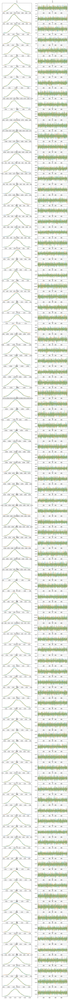

In [14]:
az.rcParams['plot.max_subplots'] = 2*(num_timepoints - R_t_start)

az.plot_trace(
    samples,
    var_names=('R'),
    filter_vars='like',
    compact=False)

In [15]:
# Eliminate burn-in iterations (1/2 of the chain lengths)
chain_samples = fit._draws[7:, 500:, :]

# Evaluate the model for all parameter sets in the samples
n_param, n_sample, n_chains = chain_samples.shape

extended_samples = np.concatenate((
    chain_samples[:, :, 0],
    chain_samples[:, :, 1],
    chain_samples[:, :, 2]), axis=1)

thinning = max(1, int(n_sample * n_chains / 500))
approx_multicat_intervals = []

for j in range(num_categories):
    approx_multicat_intervals.append(pd.DataFrame({
        'Time Points': np.arange(R_t_start, num_timepoints),
        'Mean': np.mean(correc_i[j] * extended_samples[:, ::thinning], axis=1),
        'Lower bound CI': np.quantile(correc_i[j] * extended_samples[:, ::thinning], 0.025, axis=1),
        'Upper bound CI': np.quantile(correc_i[j] * extended_samples[:, ::thinning], 0.975, axis=1),
        'Central Probability': (L1+L2+L3) * [0.95]
    }))

## 3. Imperfect Contact Tracing + Aggregated data + Poisson Branching process with multiple categories

In [16]:
agg_multicat_model = """
functions {
    real normalizing_const (array [] real aSI) {
        return sum(aSI);
    }
    real effective_no_infectives (
        int N, int S, int n, int t, array [] real aI, array [] real aSI,
        array [,] real C, array [] real transm, array [] vector ap) {
            real mean;

            mean = 0;
            for(i in 1:n){
                for(j in 1:n){
                    if(t > S) {
                        for(k in (t-S):(t-1)){
                            mean += C[i,j] * transm[j] * ap[k, j] * aI[k] * aSI[S-t+1+k] /
                                normalizing_const(aSI);
                        }
                    }
                    else {
                        for(k in 1:(t-1)){
                            mean += C[i,j] * transm[j] * ap[k, j] * aI[k] * aSI[S-t+1+k] /
                                normalizing_const(aSI);
                        }
                    }
                }
            }
            return mean;
    }
}
data {
    int N; // number of days
    int S; // length serial interval
    int n; // number of categories
    array [n, n] real C; // contact matrix
    array [n] real transm; // transmissibility vector
    array [N] int I; // local incidences for N days
    int tau; // sliding window
    array [S] real revSI; // reversed serial interval
    real a; // prior shape parameter
    real b; // prior rate parameter
    real<lower=0> sigma; // prior std parameter
}
parameters {
    array [N-tau-1] real<lower=0> R; // vector of R numbers
    simplex [n] p[N]; // vector of proportion
}
model {
    for(t in (tau+1):(N-1)) {
        for(k in (t-tau+1):(t+1)) {
            if (effective_no_infectives(N, S, n, k, I, revSI, C, transm, p) != 0) {
                I[k] ~ poisson (
                    R[t-tau] * effective_no_infectives(
                        N, S, n, k, I, revSI, C, transm, p)); // likelihood
                    }
        }
    }
    for(t in 1:(N-tau-1)) {
        R[t] ~ gamma (a, b); // prior of R
    }
    for(t in 1:N) {
        p[t] ~ dirichlet (rep_vector(1, n)); // prior for p
    }
}
"""

agg_multicat_data = {
    'N': num_timepoints,
    'S': len(serial_interval),
    'n': num_categories,
    'C': contact_matrix,
    'transm': transmissibility,
    'I': agg_cases.astype(np.integer).tolist(),
    'tau': tau,
    'revSI': serial_interval.tolist()[::-1],
    'a': a,
    'b': b,
    'sigma': sigma}

/var/folders/ph/jyxnc9y52svgq2k5lt2q4r000000gp/T/ipykernel_11401/1251656915.py:73: DeprecationWarning:

Converting `np.integer` or `np.signedinteger` to a dtype is deprecated. The current result is `np.dtype(np.int_)` which is not strictly correct. Note that the result depends on the system. To ensure stable results use may want to use `np.int64` or `np.int32`.



In [17]:
posterior = stan.build(
    agg_multicat_model, data=agg_multicat_data, random_seed=10)

fit = posterior.sample(
    num_chains=3, num_samples=1000)

samples = az.from_cmdstanpy(
    fit,
    observed_data='I',
    coords={'observation': list(range(num_timepoints)),
            'covariate': [
                '{}'.format(_)
                for _ in range(num_timepoints - R_t_start)]
            },
    dims={
        'I': ['observation'],
        'R': ['covariate'],
        })

az.summary(samples)

Building...



Building: found in cache, done.Messages from stanc:
Warning in '/var/folders/ph/jyxnc9y52svgq2k5lt2q4r000000gp/T/httpstan_1wcrya5i/model_pe5ykqxp.stan', line 46, column 4: Declaration
    of arrays by placing brackets after a variable name is deprecated and
    will be removed in Stan 2.33.0. Instead use the array keyword before the
    type. This can be changed automatically using the auto-format flag to
    stanc
Warning in '/var/folders/ph/jyxnc9y52svgq2k5lt2q4r000000gp/T/httpstan_1wcrya5i/model_pe5ykqxp.stan', line 51, column 12: A
    control flow statement depends on parameter(s): p.
Warning in '/var/folders/ph/jyxnc9y52svgq2k5lt2q4r000000gp/T/httpstan_1wcrya5i/model_pe5ykqxp.stan', line 21, column 24: A
    control flow statement inside function effective_no_infectives depends on
    argument t. At
    '/var/folders/ph/jyxnc9y52svgq2k5lt2q4r000000gp/T/httpstan_1wcrya5i/model_pe5ykqxp.stan',
    line 54, column 33 to column 34, the value of t depends on parameter(s):
    p.
Warn

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
R[0],0.345,0.052,0.249,0.437,0.002,0.001,817.0,1691.0,1.00
R[1],0.335,0.046,0.246,0.420,0.002,0.001,645.0,1368.0,1.01
R[2],0.365,0.046,0.286,0.456,0.002,0.001,613.0,1379.0,1.01
R[3],0.367,0.045,0.287,0.448,0.002,0.001,649.0,1238.0,1.01
R[4],0.372,0.043,0.294,0.451,0.002,0.001,545.0,998.0,1.01
...,...,...,...,...,...,...,...,...,...
"p[97, 1]",0.503,0.288,0.055,0.992,0.003,0.003,6595.0,2011.0,1.00
"p[98, 0]",0.502,0.293,0.051,1.000,0.004,0.003,6165.0,1234.0,1.01
"p[98, 1]",0.498,0.293,0.000,0.949,0.004,0.003,6165.0,1234.0,1.01
"p[99, 0]",0.499,0.287,0.030,0.967,0.004,0.003,6424.0,1686.0,1.00


array([[<AxesSubplot:title={'center':'R\n0'}>,
        <AxesSubplot:title={'center':'R\n0'}>],
       [<AxesSubplot:title={'center':'R\n1'}>,
        <AxesSubplot:title={'center':'R\n1'}>],
       [<AxesSubplot:title={'center':'R\n2'}>,
        <AxesSubplot:title={'center':'R\n2'}>],
       [<AxesSubplot:title={'center':'R\n3'}>,
        <AxesSubplot:title={'center':'R\n3'}>],
       [<AxesSubplot:title={'center':'R\n4'}>,
        <AxesSubplot:title={'center':'R\n4'}>],
       [<AxesSubplot:title={'center':'R\n5'}>,
        <AxesSubplot:title={'center':'R\n5'}>],
       [<AxesSubplot:title={'center':'R\n6'}>,
        <AxesSubplot:title={'center':'R\n6'}>],
       [<AxesSubplot:title={'center':'R\n7'}>,
        <AxesSubplot:title={'center':'R\n7'}>],
       [<AxesSubplot:title={'center':'R\n8'}>,
        <AxesSubplot:title={'center':'R\n8'}>],
       [<AxesSubplot:title={'center':'R\n9'}>,
        <AxesSubplot:title={'center':'R\n9'}>],
       [<AxesSubplot:title={'center':'R\n10'}>,
  

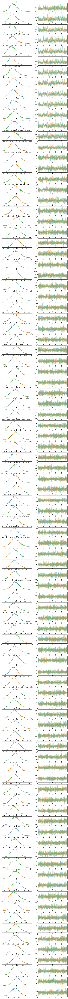

In [18]:
az.rcParams['plot.max_subplots'] = 2*(num_timepoints - R_t_start)

az.plot_trace(
    samples,
    var_names=('R'),
    filter_vars='like',
    compact=False)

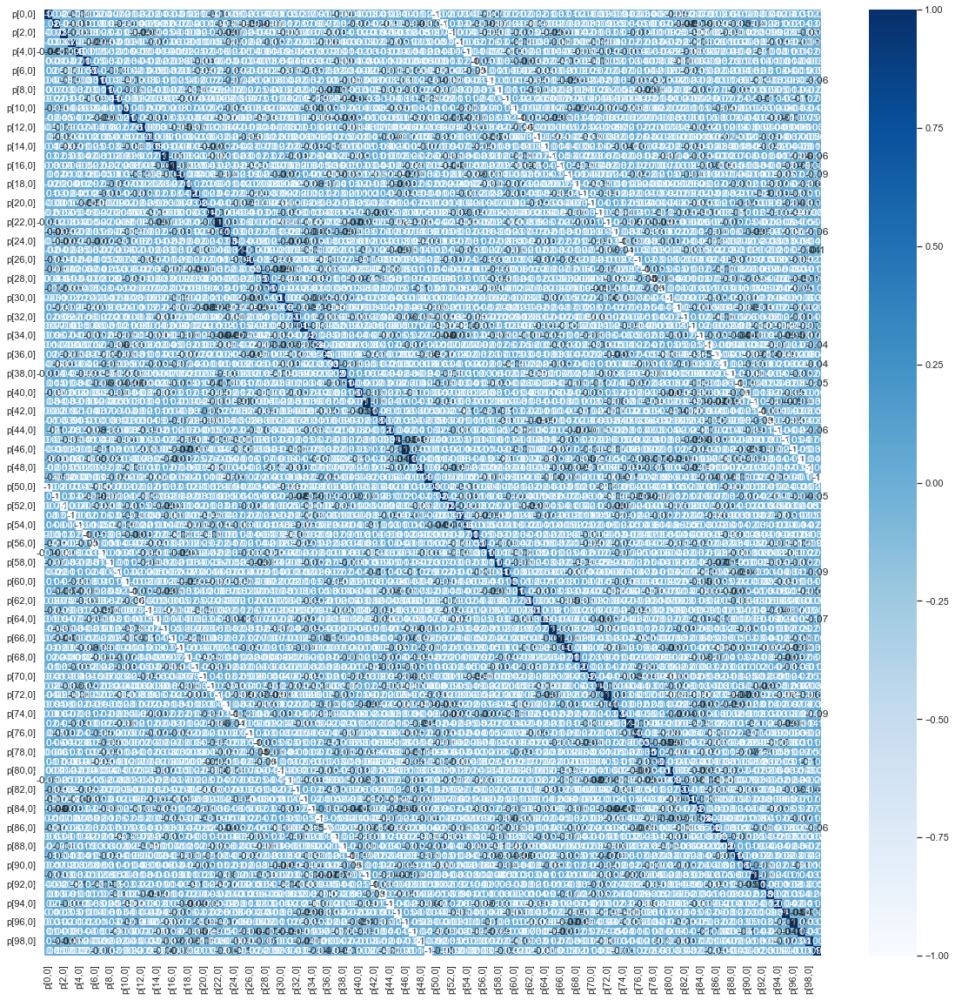

In [19]:
# Eliminate burn-in iterations (1/2 of the chain lengths)
p_chain_samples = fit._draws[(num_timepoints - R_t_start +7)::num_categories, 500:, :]

# Evaluate the model for all parameter sets in the samples
n_param, n_sample, n_chains = p_chain_samples.shape

extended_p_samples = np.concatenate((
    p_chain_samples[:, :, 0],
    p_chain_samples[:, :, 1],
    p_chain_samples[:, :, 2]), axis=1)

df = pd.DataFrame(
    np.transpose(extended_p_samples),
    columns=[
        'p[{},0]'.format(_)
        for _ in range(num_timepoints)])

plt.figure(figsize=(20,20))
sns.set_theme(style="white")
corr = df.corr()
heatmap = sns.heatmap(corr, annot=True, cmap="Blues", fmt='.1g')

In [20]:
# Eliminate burn-in iterations (1/2 of the chain lengths)
chain_samples = fit._draws[7:(num_timepoints - R_t_start +7), 500:, :]

# Evaluate the model for all parameter sets in the samples
n_param, n_sample, n_chains = chain_samples.shape

extended_samples = np.concatenate((
    chain_samples[:, :, 0],
    chain_samples[:, :, 1],
    chain_samples[:, :, 2]), axis=1)

thinning = max(1, int(n_sample * n_chains / 500))
agg_multicat_intervals = []

for j in range(num_categories):
    agg_multicat_intervals.append(pd.DataFrame({
        'Time Points': np.arange(R_t_start, num_timepoints),
        'Mean': np.mean(correc_i[j] * extended_samples[:, ::thinning], axis=1),
        'Lower bound CI': np.quantile(correc_i[j] * extended_samples[:, ::thinning], 0.025, axis=1),
        'Upper bound CI': np.quantile(correc_i[j] * extended_samples[:, ::thinning], 0.975, axis=1),
        'Central Probability': (L1+L2+L3) * [0.95]
    }))

## 4. Aggregated data + Poisson Branching process

In [21]:
poisson_model = """
functions {
    real normalizing_const (array [] real aSI) {
        return sum(aSI);
    }
    real effective_no_infectives (
        int N, int S, int t, array [] real aI, array [] real aSI) {
            real mean;
            if(t > S) {
                mean = (
                    dot_product(aI[(t-S):(t-1)], aSI) /
                    normalizing_const(aSI));
            }
            else {
                mean = (
                    dot_product(aI[:(t-1)], aSI[(S-t+2):]) /
                    normalizing_const(aSI));
            }
            return mean;
    }
}
data {
    int N; // number of days
    int S; // length serial interval
    array [N] int I; // local incidences for N days
    int tau; // sliding window
    array [S] real revSI; // reversed serial interval
    real a; // prior shape parameter
    real b; // prior rate parameter
    real<lower=0> sigma; // prior std parameter
}
parameters {
    array [N-tau-1] real<lower=0> R; // vector of R numbers
}
model {
    for(t in (tau+1):(N-1)) {
        for(k in (t-tau+1):(t+1)) {
            if (effective_no_infectives(N, S, k, I, revSI) != 0) {
                I[k] ~ poisson (
                    R[t-tau] * effective_no_infectives(
                        N, S, k, I, revSI)); // likelihood
                    }
        }
    }
    for(t in 1:(N-tau-1)) {
        R[t] ~ gamma (a, b); // prior of R
    }
}
"""

poisson_data = {
    'N': num_timepoints,
    'S': len(serial_interval),
    'I': agg_cases.astype(np.integer).tolist(),
    'tau': tau,
    'revSI': serial_interval.tolist()[::-1],
    'a': a,
    'b': b,
    'sigma': sigma}

/var/folders/ph/jyxnc9y52svgq2k5lt2q4r000000gp/T/ipykernel_11401/1887272557.py:54: DeprecationWarning:

Converting `np.integer` or `np.signedinteger` to a dtype is deprecated. The current result is `np.dtype(np.int_)` which is not strictly correct. Note that the result depends on the system. To ensure stable results use may want to use `np.int64` or `np.int32`.



In [22]:
posterior = stan.build(
    poisson_model, data=poisson_data, random_seed=10)

fit = posterior.sample(
    num_chains=3, num_samples=1000)

samples = az.from_cmdstanpy(
    fit,
    observed_data='I',
    coords={'observation': list(range(num_timepoints)),
            'covariate': [
                '{}'.format(_)
                for _ in range(num_timepoints - R_t_start)]
            },
    dims={
        'I': ['observation'],
        'R': ['covariate']
        })

az.summary(samples)

Building...



Building: found in cache, done.Messages from stanc:
    provided, or the prior(s) depend on data variables. In the later case,
    this may be a false positive.
Sampling:   0%
Sampling:   0% (1/6000)
Sampling:   0% (2/6000)
Sampling:   0% (3/6000)
Sampling:   2% (102/6000)
Sampling:   3% (201/6000)
Sampling:   5% (300/6000)
Sampling:   7% (400/6000)
Sampling:   8% (500/6000)
Sampling:  10% (600/6000)
Sampling:  12% (700/6000)
Sampling:  13% (800/6000)
Sampling:  15% (900/6000)
Sampling:  17% (1000/6000)
Sampling:  18% (1100/6000)
Sampling:  20% (1200/6000)
Sampling:  22% (1300/6000)
Sampling:  23% (1400/6000)
Sampling:  25% (1500/6000)
Sampling:  27% (1600/6000)
Sampling:  28% (1700/6000)
Sampling:  30% (1800/6000)
Sampling:  32% (1900/6000)
Sampling:  33% (2000/6000)
Sampling:  35% (2100/6000)
Sampling:  37% (2200/6000)
Sampling:  38% (2300/6000)
Sampling:  40% (2400/6000)
Sampling:  42% (2500/6000)
Sampling:  43% (2600/6000)
Sampling:  45% (2700/6000)
Sampling:  47% (2801/6000)
Samp

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
R[0],2.500,0.271,2.005,3.009,0.004,0.003,4406.0,1867.0,1.0
R[1],2.429,0.229,1.998,2.850,0.004,0.003,3951.0,2131.0,1.0
R[2],2.651,0.214,2.279,3.063,0.003,0.002,4597.0,2318.0,1.0
R[3],2.663,0.192,2.310,3.023,0.003,0.002,3851.0,1955.0,1.0
R[4],2.707,0.188,2.355,3.045,0.003,0.002,4037.0,2269.0,1.0
...,...,...,...,...,...,...,...,...,...
R[88],1.255,0.090,1.091,1.429,0.001,0.001,3698.0,2326.0,1.0
R[89],1.149,0.084,1.000,1.309,0.001,0.001,4177.0,2347.0,1.0
R[90],1.103,0.082,0.949,1.258,0.001,0.001,4187.0,1983.0,1.0
R[91],1.158,0.084,1.011,1.324,0.001,0.001,3768.0,2132.0,1.0


array([[<AxesSubplot:title={'center':'R\n0'}>,
        <AxesSubplot:title={'center':'R\n0'}>],
       [<AxesSubplot:title={'center':'R\n1'}>,
        <AxesSubplot:title={'center':'R\n1'}>],
       [<AxesSubplot:title={'center':'R\n2'}>,
        <AxesSubplot:title={'center':'R\n2'}>],
       [<AxesSubplot:title={'center':'R\n3'}>,
        <AxesSubplot:title={'center':'R\n3'}>],
       [<AxesSubplot:title={'center':'R\n4'}>,
        <AxesSubplot:title={'center':'R\n4'}>],
       [<AxesSubplot:title={'center':'R\n5'}>,
        <AxesSubplot:title={'center':'R\n5'}>],
       [<AxesSubplot:title={'center':'R\n6'}>,
        <AxesSubplot:title={'center':'R\n6'}>],
       [<AxesSubplot:title={'center':'R\n7'}>,
        <AxesSubplot:title={'center':'R\n7'}>],
       [<AxesSubplot:title={'center':'R\n8'}>,
        <AxesSubplot:title={'center':'R\n8'}>],
       [<AxesSubplot:title={'center':'R\n9'}>,
        <AxesSubplot:title={'center':'R\n9'}>],
       [<AxesSubplot:title={'center':'R\n10'}>,
  

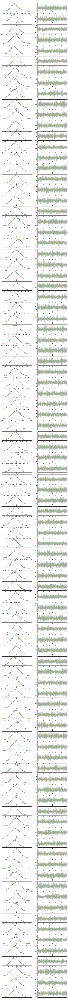

In [23]:
az.rcParams['plot.max_subplots'] = 2*(num_timepoints - R_t_start)

az.plot_trace(
    samples,
    var_names=('R'),
    filter_vars='like',
    compact=False)

In [24]:
# Eliminate burn-in iterations (1/2 of the chain lengths)
chain_samples = fit._draws[7:, 500:, :]

# Evaluate the model for all parameter sets in the samples
n_param, n_sample, n_chains = chain_samples.shape

extended_samples = np.concatenate((
    chain_samples[:, :, 0],
    chain_samples[:, :, 1],
    chain_samples[:, :, 2]), axis=1)

thinning = max(1, int(n_sample * n_chains / 500))

pois_intervals = pd.DataFrame({
    'Time Points': np.arange(R_t_start, num_timepoints),
    'Mean': np.mean(extended_samples[:, ::thinning], axis=1),
    'Lower bound CI': np.quantile(extended_samples[:, ::thinning], 0.025, axis=1),
    'Upper bound CI': np.quantile(extended_samples[:, ::thinning], 0.975, axis=1),
    'Central Probability': (L1+L2+L3) * [0.95]
})

## Inference plot using class method results

In [35]:
fig = ReproductionNumberPlot()

for j in range(num_categories):
    fig.add_ground_truth_rt(ground_truth[j])
    fig.add_interval_rt(exact_multicat_intervals[j], model_type='Category {} Perfect Contact Data'.format(j+1))
    fig.add_interval_rt(approx_multicat_intervals[j], colour='red', model_type='Category {} Desggregate + Limited Contact Data'.format(j+1))
    fig.add_interval_rt(agg_multicat_intervals[j], colour='orange', model_type='Category {} Aggregate + Limited Contact Data'.format(j+1))
fig.add_interval_rt(pois_intervals, colour='deepskyblue', model_type='1-category Poisson')
   
fig.update_labels(time_label='Time (Day)', r_label='R_t')

fig.figure.add_hline(
    y=1, line_dash='dot',
    annotation_text='R<sub>t</sub>=1', fillcolor='black',
    annotation_position='top left')

fig.figure.update_layout(
    width=900, 
    height=700,
    plot_bgcolor='white',
    font=dict(
            size=16),
    xaxis=dict(
        linecolor='black'),
    yaxis=dict(
        linecolor='black'),
    legend=dict(
            orientation="h",
            yanchor="bottom",
            y=0.9,
            xanchor="right",
            x=1.05,
            bordercolor="Black",
            borderwidth=1
        )
)

fig.figure.write_image('images/Figure 2.pdf')

fig.show_figure()

In [43]:
fig = ReproductionNumberPlot()

j=0
fig.add_ground_truth_rt(ground_truth[j])
fig.figure.data[0]['name'] = 'True R<sup>({})</sup><sub>t</sub>'.format(j+1)

fig.add_interval_rt(approx_multicat_intervals[j], colour='red', model_type='<sup>({})</sup><sub>t</sub> Disaggregated + Limited Contact Data Multiple Group Model'.format(j+1))
fig.figure.data[1]['name'] = 'Estimated R<sup>({})</sup><sub>t</sub> Disaggregated + Limited Contact Data Multiple Group Model'.format(j+1)

fig.add_interval_rt(agg_multicat_intervals[j], colour='orange', model_type='<sup>({})</sup><sub>t</sub> Aggregated + Limited Contact Data Multiple Group Model'.format(j+1))
fig.figure.data[3]['name'] = 'Estimated R<sup>({})</sup><sub>t</sub> Aggregated + Limited Contact Data Multiple Group Model'.format(j+1)

fig.add_interval_rt(pois_intervals, colour='deepskyblue', model_type='One Group Model')
fig.figure.data[5]['name'] = 'Estimated R<sub>t</sub> One Group Model'
   
fig.update_labels(time_label='Time (days)', r_label='Reproduction number R<sub>t</sub>')

for i in range(3):
        fig.figure['data'][2*(i+1)]['showlegend'] = False

fig.figure.add_hline(
    y=1, line_dash='dot',
    annotation_text='R<sub>t</sub>=1', fillcolor='black',
    annotation_position='top left')

fig.figure.update_layout(
    width=900, 
    height=600,
    plot_bgcolor='white',
    font=dict(
            size=16),
    xaxis=dict(
        linecolor='black'),
    yaxis=dict(
        linecolor='black'),
    legend=dict(
            orientation="h",
            yanchor="bottom",
            y=0.8,
            xanchor="right",
            x=1.1,
            bordercolor="Black",
            borderwidth=1
        )
)

fig.figure.write_image('images/Figure 3.pdf')

fig.show_figure()

In [47]:
fig = ReproductionNumberPlot()

j=0
fig.add_ground_truth_rt(ground_truth[j])
fig.figure.data[0]['name'] = 'True R<sup>({})</sup><sub>t</sub>'.format(j+1)

fig.add_interval_rt(exact_multicat_intervals[j], colour='mediumvioletred', model_type='<sup>({})</sup><sub>t</sub> Perfect Contact Data Multiple Group Model'.format(j+1))
fig.figure.data[1]['name'] = 'Estimated R<sup>({})</sup><sub>t</sub> Perfect Contact Data Multiple Group Model'.format(j+1)

fig.add_interval_rt(pois_intervals, colour='deepskyblue', model_type='One Group Model')
fig.figure.data[3]['name'] = 'Estimated R<sub>t</sub> One Group Model'
   
fig.update_labels(time_label='Time (days)', r_label='Reproduction number R<sub>t</sub>')

for i in range(2):
        fig.figure['data'][2*(i+1)]['showlegend'] = False

fig.figure.add_hline(
    y=1, line_dash='dot',
    annotation_text='R<sub>t</sub>=1', fillcolor='black',
    annotation_position='top left')

fig.figure.update_layout(
    width=900, 
    height=600,
    plot_bgcolor='white',
    font=dict(
            size=16),
    xaxis=dict(
        linecolor='black'),
    yaxis=dict(
        linecolor='black'),
    legend=dict(
            orientation="h",
            yanchor="bottom",
            y=0.8,
            xanchor="right",
            x=1.05,
            bordercolor="Black",
            borderwidth=1
        )
)

fig.figure.write_image('images/Figure 3 Perfect.pdf')

fig.show_figure()

In [40]:
fig = ReproductionNumberPlot()

j=1
fig.add_ground_truth_rt(ground_truth[j])
fig.figure.data[0]['name'] = 'True R<sup>({})</sup><sub>t</sub>'.format(j+1)

fig.add_interval_rt(approx_multicat_intervals[j], colour='red', model_type='<sup>({})</sup><sub>t</sub> Disaggregated + Limited Contact Data Multiple Group Model'.format(j+1))
fig.figure.data[1]['name'] = 'Estimated R<sup>({})</sup><sub>t</sub> Disaggregated + Limited Contact Data Multiple Group Model'.format(j+1)

fig.add_interval_rt(agg_multicat_intervals[j], colour='orange', model_type='<sup>({})</sup><sub>t</sub> Aggregated + Limited Contact Data Multiple Group Model'.format(j+1))
fig.figure.data[3]['name'] = 'Estimated R<sup>({})</sup><sub>t</sub> Aggregated + Limited Contact Data Multiple Group Model'.format(j+1)

fig.add_interval_rt(pois_intervals, colour='deepskyblue', model_type='One Group Model')
fig.figure.data[5]['name'] = 'Estimated R<sub>t</sub> One Group Model'

fig.update_labels(time_label='Time (days)', r_label='Reproduction number R<sub>t</sub>')

for i in range(3):
        fig.figure['data'][2*(i+1)]['showlegend'] = False

fig.figure.add_hline(
    y=1, line_dash='dot',
    annotation_text='R<sub>t</sub>=1', fillcolor='black',
    annotation_position='top left')

fig.figure.update_layout(
    width=900, 
    height=600,
    plot_bgcolor='white',
    font=dict(
            size=16),
    xaxis=dict(
        linecolor='black'),
    yaxis=dict(
        linecolor='black'),
    legend=dict(
            orientation="h",
            yanchor="bottom",
            y=0.8,
            xanchor="right",
            x=1.05,
            bordercolor="Black",
            borderwidth=1
        )
)

fig.figure.write_image('images/Figure 4.pdf')

fig.show_figure()

In [49]:
fig = ReproductionNumberPlot()

j=1
fig.add_ground_truth_rt(ground_truth[j])
fig.figure.data[0]['name'] = 'True R<sup>({})</sup><sub>t</sub>'.format(j+1)

fig.add_interval_rt(exact_multicat_intervals[j], colour='mediumvioletred', model_type='<sup>({})</sup><sub>t</sub> Perfect Contact Data Multiple Group Model'.format(j+1))
fig.figure.data[1]['name'] = 'Estimated R<sup>({})</sup><sub>t</sub> Perfect Contact Data Multiple Group Model'.format(j+1)

fig.add_interval_rt(pois_intervals, colour='deepskyblue', model_type='One Group Model')
fig.figure.data[3]['name'] = 'Estimated R<sub>t</sub> One Group Model'

fig.update_labels(time_label='Time (days)', r_label='Reproduction number R<sub>t</sub>')

for i in range(2):
        fig.figure['data'][2*(i+1)]['showlegend'] = False

fig.figure.add_hline(
    y=1, line_dash='dot',
    annotation_text='R<sub>t</sub>=1', fillcolor='black',
    annotation_position='top left')

fig.figure.update_layout(
    width=900, 
    height=600,
    plot_bgcolor='white',
    font=dict(
            size=16),
    xaxis=dict(
        linecolor='black'),
    yaxis=dict(
        linecolor='black'),
    legend=dict(
            orientation="h",
            yanchor="bottom",
            y=0.8,
            xanchor="right",
            x=1.05,
            bordercolor="Black",
            borderwidth=1
        )
)

fig.figure.write_image('images/Figure 4 Perfect.pdf')

fig.show_figure()